<a href="https://colab.research.google.com/github/ayanghosh007/myrepository/blob/main/Major_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/Aryavir07/From-Detection-To-The-Segmentation-Of-Brain-Tumors.git
%cd From-Detection-To-The-Segmentation-Of-Brain-Tumors


Cloning into 'From-Detection-To-The-Segmentation-Of-Brain-Tumors'...
remote: Enumerating objects: 372, done.
remote: Counting objects: 100% (170/170), done.
remote: Compressing objects: 100% (143/143), done.
remote: Total 372 (delta 99), reused 53 (delta 24), pack-reused 202 (from 1)
Receiving objects: 100% (372/372), 28.11 MiB | 26.85 MiB/s, done.
Resolving deltas: 100% (180/180), done.
Filtering content: 100% (2/2), 333.26 MiB | 34.66 MiB/s, done.
/content/From-Detection-To-The-Segmentation-Of-Brain-Tumors


In [ ]:
import shutil

# Replace 'my_folder' with your actual folder name
shutil.copytree('/content/From-Detection-To-The-Segmentation-Of-Brain-Tumors', '/content/drive/MyDrive/new')


'/content/drive/MyDrive/new'

In [1]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
pip install -r requirements.txt


ERROR: Invalid requirement: 'brotlipy==0.7.': Expected end or semicolon (after version specifier)
    brotlipy==0.7.
            ~~~~~^ (from line 15 of requirements.txt)


In [ ]:
!pip install tensorflow==2.8

ERROR: Could not find a version that satisfies the requirement tensorflow==2.8 (from versions: 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.0.post1, 2.15.1, 2.16.0rc0, 2.16.1, 2.16.2, 2.17.0rc0, 2.17.0rc1, 2.17.0, 2.17.1, 2.18.0rc0, 2.18.0rc1, 2.18.0rc2, 2.18.0, 2.18.1, 2.19.0rc0, 2.19.0)
ERROR: No matching distribution found for tensorflow==2.8


In [5]:
import zipfile
import pandas as pd
import random
import tensorflow as tf
import seaborn as sns
import numpy as np
import os
import PIL
import pickle
from PIL import *
import cv2
import glob
from skimage import io
from sklearn.metrics import accuracy_score
from tensorflow.keras import Model
from tensorflow import keras
from sklearn.metrics import confusion_matrix
from tensorflow.keras.applications import DenseNet121 # 2017 architecture
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.optimizers import RMSprop, SGD
from tensorflow.keras.layers import *
from tensorflow.keras import Model
from tensorflow.keras.models import load_model
from tensorflow import keras
import matplotlib.pyplot as plt
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from prettytable import PrettyTable
from sklearn.metrics import classification_report
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint, LearningRateScheduler
from pathlib import Path
import cv2 as cv
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, optimizers
from tensorflow.keras.applications.resnet50 import ResNet50
%matplotlib inline

In [7]:
%tensorflow_version

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [8]:
# data containing path to Brain MRI and their corresponding mask

data_mask = "/content/drive/MyDrive/new/data_mask.csv"
# data containing path to Brain MRI and their corresponding mask
brain_df = pd.read_csv(data_mask)

In [9]:
brain_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   patient_id  3929 non-null   object
 1   image_path  3929 non-null   object
 2   mask_path   3929 non-null   object
 3   mask        3929 non-null   int64 
dtypes: int64(1), object(3)
memory usage: 122.9+ KB


In [10]:
brain_df.shape

(3929, 4)

In [11]:
brain_df.head(5)

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [12]:
brain_df.image_path[1] # Path to the MRI Image

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif'

In [13]:
brain_df.mask_path[1] # Path to the Segmentated MASK

'TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_mask.tif'

In [14]:
print(brain_df['mask'].value_counts())
print(brain_df['mask'].value_counts().index)

mask
0    2556
1    1373
Name: count, dtype: int64
Index([0, 1], dtype='int64', name='mask')


In [15]:
#DATA VISUALIZATION
brain_df

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...,...
3924,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_DU_6401_19831001,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_DU_6401_19831001,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [ ]:
from google.colab import files

# Upload the kaggle.json file you downloaded
files.upload()


{}

In [ ]:
import os
import zipfile

# Create .kaggle folder
os.makedirs('/root/.kaggle', exist_ok=True)

# Move kaggle.json to the right location
!mv kaggle.json /root/.kaggle/

# Give the right permissions
!chmod 600 /root/.kaggle/kaggle.json


In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation


Dataset URL: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
License(s): CC-BY-NC-SA-4.0
 97% 689M/714M [00:03<00:00, 156MB/s]
100% 714M/714M [00:03<00:00, 208MB/s]


In [ ]:
!kaggle datasets download -d mateuszbuda/lgg-mri-segmentation -p "/content/drive/MyDrive/kaggle_datasets"


Dataset URL: https://www.kaggle.com/datasets/mateuszbuda/lgg-mri-segmentation
License(s): CC-BY-NC-SA-4.0
 96% 685M/714M [00:03<00:00, 209MB/s]
100% 714M/714M [00:04<00:00, 169MB/s]


In [ ]:
import zipfile

zip_path = "/content/drive/MyDrive/kaggle_datasets/lgg-mri-segmentation.zip"
extract_path = "/content/drive/MyDrive/lgg_dataset"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [16]:
df_detail = pd.read_csv("/content/drive/MyDrive/lgg_dataset/kaggle_3m/data.csv")

In [17]:
df_detail.head()

,Patient,RNASeqCluster,MethylationCluster,miRNACluster,CNCluster,RPPACluster,OncosignCluster,COCCluster,histological_type,neoplasm_histologic_grade,tumor_tissue_site,laterality,tumor_location,gender,age_at_initial_pathologic,race,ethnicity,death01
0,TCGA_CS_4941,2.0,4.0,2,2.0,NaN,3.0,2,1.0,2.0,1.0,3.0,2.0,2.0,67.0,3.0,2.0,1.0
1,TCGA_CS_4942,1.0,5.0,2,1.0,1.0,2.0,1,1.0,2.0,1.0,3.0,2.0,1.0,44.0,2.0,NaN,1.0
2,TCGA_CS_4943,1.0,5.0,2,1.0,2.0,2.0,1,1.0,2.0,1.0,1.0,2.0,2.0,37.0,3.0,NaN,0.0
3,TCGA_CS_4944,NaN,5.0,2,1.0,2.0,1.0,1,1.0,1.0,1.0,3.0,6.0,2.0,50.0,3.0,NaN,0.0
4,TCGA_CS_5393,4.0,5.0,2,1.0,2.0,3.0,1,1.0,2.0,1.0,1.0,6.0,2.0,39.0,3.0,NaN,0.0


In [18]:
print("Number of patients:", df_detail.Patient.nunique())

Number of patients: 110


In [19]:
df_detail.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110 entries, 0 to 109
Data columns (total 18 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Patient                    110 non-null    object 
 1   RNASeqCluster              92 non-null     float64
 2   MethylationCluster         109 non-null    float64
 3   miRNACluster               110 non-null    int64  
 4   CNCluster                  108 non-null    float64
 5   RPPACluster                98 non-null     float64
 6   OncosignCluster            105 non-null    float64
 7   COCCluster                 110 non-null    int64  
 8   histological_type          109 non-null    float64
 9   neoplasm_histologic_grade  109 non-null    float64
 10  tumor_tissue_site          109 non-null    float64
 11  laterality                 109 non-null    float64
 12  tumor_location             109 non-null    float64
 13  gender                     109 non-null    float64

In [ ]:
df_detail.columns

Index(['Patient', 'RNASeqCluster', 'MethylationCluster', 'miRNACluster',
       'CNCluster', 'RPPACluster', 'OncosignCluster', 'COCCluster',
       'histological_type', 'neoplasm_histologic_grade', 'tumor_tissue_site',
       'laterality', 'tumor_location', 'gender', 'age_at_initial_pathologic',
       'race', 'ethnicity', 'death01'],
      dtype='object')

<Axes: xlabel='death01'>

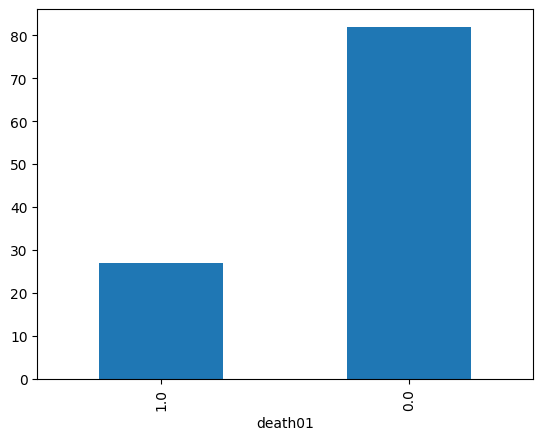

In [ ]:
df_detail.death01.value_counts().sort_values().plot(kind = 'bar')

<Axes: xlabel='tumor_location'>

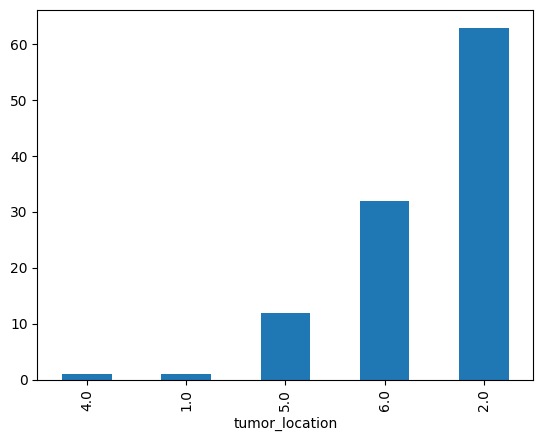

In [ ]:
df_detail.tumor_location.value_counts().sort_values().plot(kind = 'bar')

<Axes: xlabel='gender'>

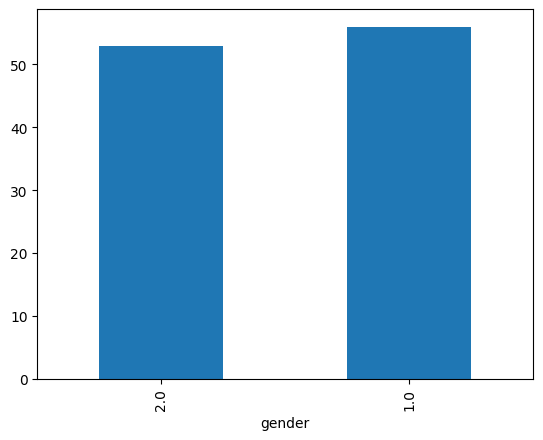

In [ ]:
df_detail.gender.value_counts().sort_values().plot(kind = 'bar')

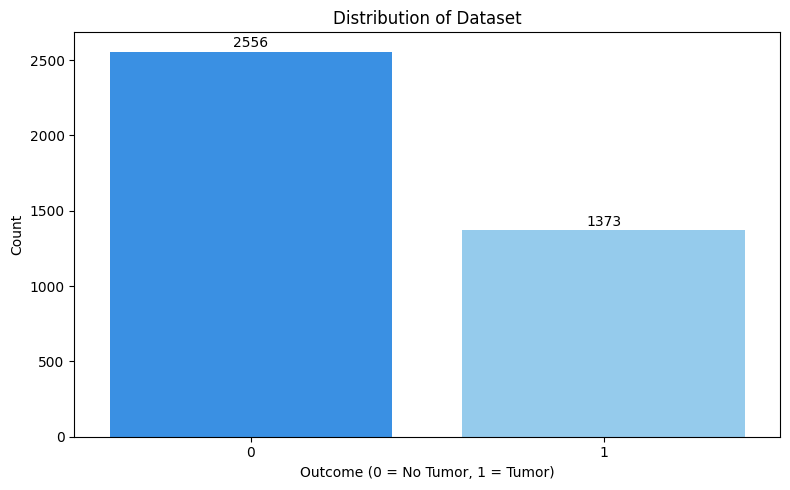

In [ ]:
custom_colors = [
    (30/255, 144/255, 255/255),
    (135/255, 206/255, 250/255)  # Slate Gray
       # Gray  # Blue-ish for 0, Red-ish for 1
                ]

# Plot countplot
plt.figure(figsize=(8, 5))
ax = sns.countplot(x='mask', data=brain_df, palette=custom_colors)

# Add text labels on top of each bar
for p in ax.patches:
    height = p.get_height()
    ax.text(p.get_x() + p.get_width() / 2., height + 28,  # +2 for spacing above bar
            int(height), ha="center")
# Set plot labels and title
plt.title('Distribution of Dataset')
plt.xlabel('Outcome (0 = No Tumor, 1 = Tumor)')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

### MASK
- **What Is Mask?**
    - The goal of image segmentation is to understand image at the pixel level. It associates each pixel with a certian class. The output produced by image segementation model is called **MASK** of the image.
- Mask can be represented by associating pixel values with their coordinates for example it we have a black image of shape (2,2) this can be represented as:
[[0,0],
[0,0]]
- If our output mask is as follows:
[[255,0],
[0,255]]

- To represent this mask we have to first flatten the image into a 1-D array. this would result in something like [255,0,0,255] for mask . then we can use the index to create the mask. finally we would have something like [1,0,0,1] as our mask.

In [20]:
brain_df.mask_path

,mask_path
0,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...
1,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...
2,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...
3,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...
4,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...
...,...
3924,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...


In [ ]:
brain_df.image_path

,image_path
0,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif
1,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif
2,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif
3,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif
4,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif
...,...
3924,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...
3925,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...
3926,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...
3927,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...


In [ ]:
brain_df['mask'].value_counts()

,count
mask,
0,2556
1,1373


In [21]:
%cd /content/drive/MyDrive/lgg_dataset/kaggle_3m

/content/drive/MyDrive/lgg_dataset/kaggle_3m


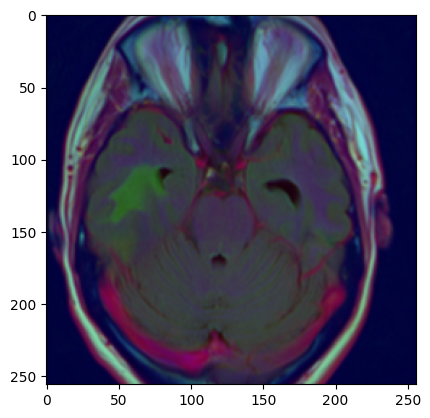

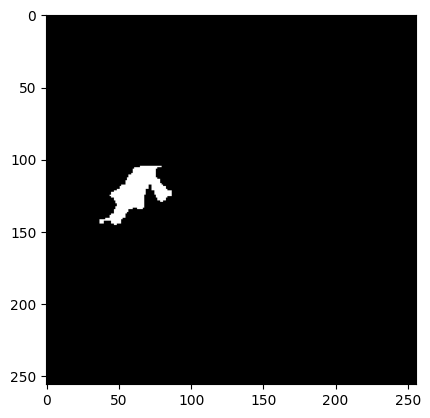

In [22]:
# SHOW A RANDOM IMAGE AND THEIR CORRESPONDING MASK


plt.imshow(cv2.imread(brain_df.image_path[1054]))
plt.show()
plt.imshow(cv2.imread(brain_df.mask_path[1054]))
plt.show()


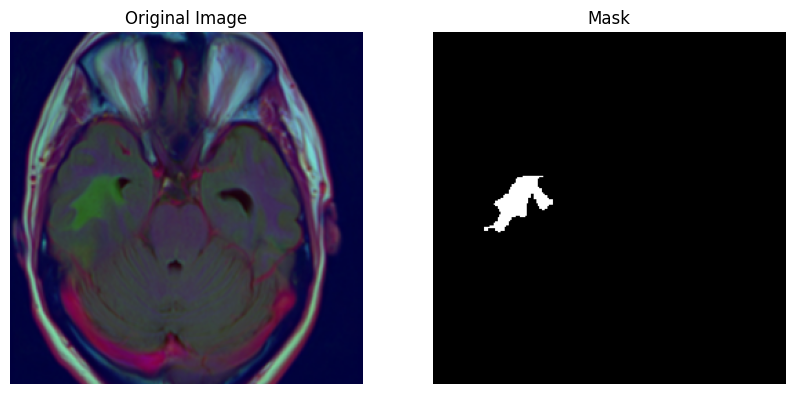

In [23]:
# prompt: as the previous cell, i want the output as side by side. is this possible?

plt.figure(figsize=(10, 5))

# Original Image
plt.subplot(1, 2, 1) # 1 row, 2 columns, 1st plot
plt.imshow(cv2.imread(brain_df.image_path[1054]))
plt.title("Original Image")
plt.axis('off') # Hide axes

# Mask Image
plt.subplot(1, 2, 2) # 1 row, 2 columns, 2nd plot
plt.imshow(cv2.imread(brain_df.mask_path[1054]))
plt.title("Mask")
plt.axis('off') # Hide axes

#plt.tight_layout() # Adjust layout to prevent overlap
plt.show()

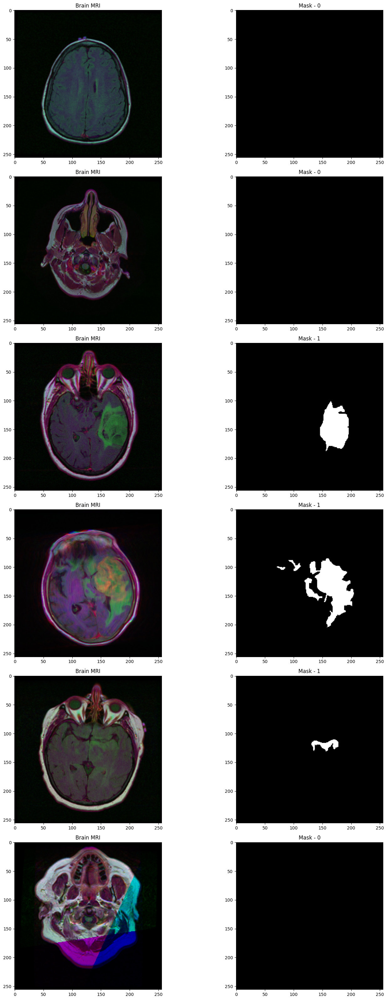

In [24]:
# Basic visualizations: Visualize the images (MRI and Mask) in the dataset separately
import random
fig, axs = plt.subplots(6,2, figsize=(16,32))
count = 0
for x in range(6):
  i = random.randint(0, len(brain_df)) # select a random index
  axs[count][0].title.set_text("Brain MRI") # set title
  axs[count][0].imshow(cv2.imread(brain_df.image_path[i])) # show MRI
  axs[count][1].title.set_text("Mask - " + str(brain_df['mask'][i])) # plot title on the mask (0 or 1)
  axs[count][1].imshow(cv2.imread(brain_df.mask_path[i])) # Show corresponding mask
  count += 1

fig.tight_layout()

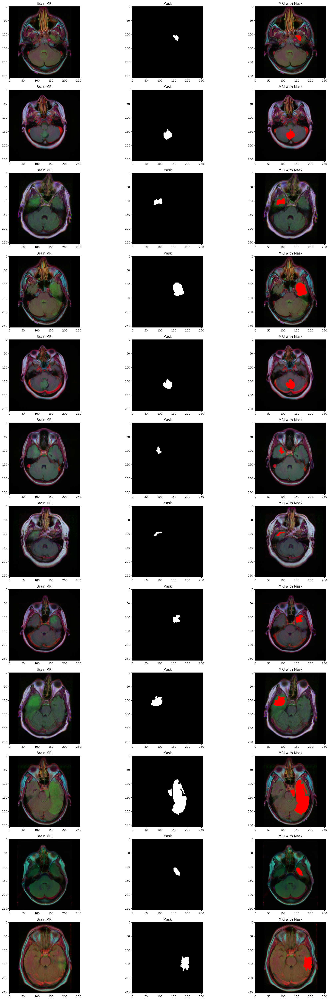

In [25]:
# Advanced Visualization: visualize the MRI scans along with their mask on one image
count = 0
fig, axs = plt.subplots(12,3, figsize=(20,50))
for i in range(len(brain_df)):
  if brain_df['mask'][i] == 1 and count < 12:
  # read the images
    img = io.imread(brain_df.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # obtain the mask for the image
    mask = io.imread(brain_df.mask_path[i])
    axs[count][1].title.set_text("Mask")
    axs[count][1].imshow(mask, cmap = 'gray')

    # replace the values in the image with red color (255,0,0) if any mask pixel in the mask was = 255
    img[mask == 255] = (255,0,0)
    axs[count][2].title.set_text("MRI with Mask")
    axs[count][2].imshow(img)
    count += 1

fig.tight_layout()

In [26]:
img = io.imread(brain_df.image_path[0])
type(img), len(img)

(numpy.ndarray, 256)

In [27]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [28]:
brain_df_train

,image_path,mask_path,mask
0,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0
...,...,...,...
3924,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_86...,0
3925,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_87...,0
3926,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,TCGA_HT_A61B_19991127/TCGA_HT_A61B_19991127_87...,0
3927,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_88...,0


In [50]:
# Convert the data in mask column to string format, to use categorical mode in flow_from_dataframe
# You will get this error message if you comment out the following code line:
# TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.
brain_df_train['mask'] = brain_df_train['mask'].apply(lambda x: str(x))

In [30]:
brain_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3929 entries, 0 to 3928
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  3929 non-null   object
 1   mask_path   3929 non-null   object
 2   mask        3929 non-null   object
dtypes: object(3)
memory usage: 92.2+ KB


In [31]:
from pathlib import Path
p = Path('/content/drive/MyDrive/lgg_dataset/kaggle_3m')

In [ ]:
folders = list(p.glob('./**'))
folders

[PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4941_19960909'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4942_19970222'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4943_20000902'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4944_20010208'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5393_19990606'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5395_19981004'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5396_20010302'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5397_20010315'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_6186_20000601'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_6188_20010812'),
 PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_6290_20000917'),
 PosixPath('/content/drive/MyDrive/lgg

In [ ]:
for x in folders:
    currentFolder = list(x.glob('./**')) # folders
    for y in currentFolder:
        files = list(y.glob('./*'))
        print('FOLDER NAME:'," ", y)
        print(files)
        print()

    print()

FOLDER NAME:   /content/drive/MyDrive/lgg_dataset/kaggle_3m
[PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/README.md'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4941_19960909'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4942_19970222'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4943_20000902'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_4944_20010208'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5393_19990606'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5395_19981004'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5396_20010302'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_5397_20010315'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_6186_20000601'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_CS_6188_20010812'), PosixPath('/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA

In [32]:
brain_df.mask_path[63]

'TCGA_FG_A4MT_20020212/TCGA_FG_A4MT_20020212_1_mask.tif'

In [33]:
pth = "/content/drive/MyDrive/lgg_dataset/kaggle_3m"

In [34]:
glob.glob(pth + brain_df.mask_path[623])

[]

In [35]:
# im_plt = plt.imread(brain_df.mask_path[623])
im_cv = cv.imread(pth + brain_df.mask_path[623])[:, :, ::-1] #OpenCV users BGR instead of RGB
plt.axis("off")
# plt.imshow(im_plt)
plt.imshow(im_cv) # works
plt.show()

TypeError: 'NoneType' object is not subscriptable

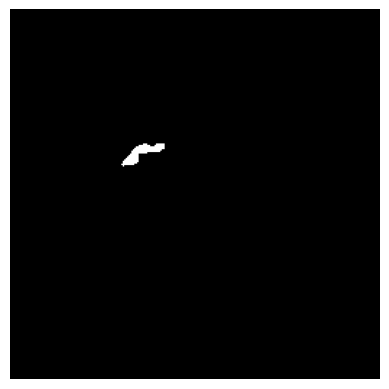

In [36]:
# im_plt = plt.imread(brain_df.mask_path[623])
# Assuming brain_df.mask_path contains paths like '/kaggle_3m/...'
# We need to remove '/kaggle_3m/' from the start if the current directory is /content/drive/MyDrive/lgg_dataset/kaggle_3m
mask_relative_path = brain_df.mask_path[623]
if mask_relative_path.startswith('/kaggle_3m/'):
    mask_relative_path = mask_relative_path[len('/kaggle_3m/'):]

# The image should now be readable using the relative path within the current directory
# Ensure the current working directory is '/content/drive/MyDrive/lgg_dataset/kaggle_3m' as set earlier
im_cv = cv.imread(mask_relative_path)[:, :, ::-1] #OpenCV users BGR instead of RGB
plt.axis("off")
# plt.imshow(im_plt)
plt.imshow(im_cv) # works
plt.show()

In [37]:
def edit_path(mask_path:str):
  mask_path = "/content/drive/MyDrive/lgg_dataset/kaggle_3m/" + mask_path
  return mask_path

In [38]:
from tqdm.notebook import tqdm
tqdm.pandas()

In [39]:
brain_df.head()

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1.tif,TCGA_CS_5395_19981004/TCGA_CS_5395_19981004_1_...,0
1,TCGA_CS_5395_19981004,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1.tif,TCGA_CS_4944_20010208/TCGA_CS_4944_20010208_1_...,0
2,TCGA_CS_5395_19981004,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909/TCGA_CS_4941_19960909_1_...,0
3,TCGA_CS_5395_19981004,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1.tif,TCGA_CS_4943_20000902/TCGA_CS_4943_20000902_1_...,0
4,TCGA_CS_5395_19981004,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1.tif,TCGA_CS_5396_20010302/TCGA_CS_5396_20010302_1_...,0


In [40]:
brain_df.image_path = brain_df.image_path.progress_apply(lambda x: edit_path(x))

  0%|          | 0/3929 [00:00<?, ?it/s]

In [41]:
brain_df.mask_path = brain_df.mask_path.progress_apply(lambda x: edit_path(x))

  0%|          | 0/3929 [00:00<?, ?it/s]

In [42]:
brain_df.head()

,patient_id,image_path,mask_path,mask
0,TCGA_CS_5395_19981004,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0
1,TCGA_CS_5395_19981004,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0
2,TCGA_CS_5395_19981004,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0
3,TCGA_CS_5395_19981004,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0
4,TCGA_CS_5395_19981004,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0


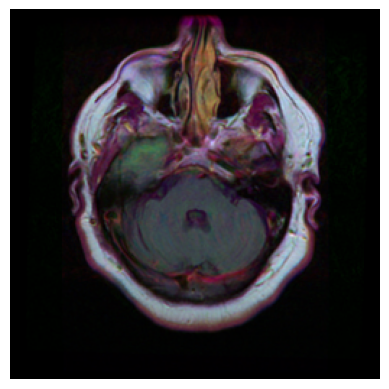

In [43]:
plt.imshow(cv2.imread(brain_df.image_path[623]))
plt.axis("off")
plt.show()

In [44]:
brain_df.mask_path[632]

'/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_HT_7882_19970125/TCGA_HT_7882_19970125_6_mask.tif'

In [45]:
# Drop the patient id column
brain_df_train = brain_df.drop(columns = ['patient_id'])
brain_df_train.shape

(3929, 3)

In [46]:
# split the data into train and test data

from sklearn.model_selection import train_test_split

train, test = train_test_split(brain_df_train, test_size = 0.23)

In [47]:
def train_val_test_data_gen(TRAIN:pd.DataFrame,TRAIN_PATH:str, VAL:pd.DataFrame, VAL_PATH:str, TEST:pd.DataFrame,
                            TEXT_PATH:str, CLASS_MODE: str, BATCH_SIZE=16, IMAGE_SHAPE = (256,256)):
    # Create a data generator which scales the data in range  [0, 1] and makes validation split of 30%
    datagen = ImageDataGenerator(
                                 rescale=1./255., # normalize
                                 validation_split = 0.30)

    train_generator=datagen.flow_from_dataframe(
                                                    dataframe=TRAIN,
                                                    directory= TRAIN_PATH,
                                                    x_col='image_path',
                                                    y_col='mask',
                                                    subset="training",
                                                    batch_size=BATCH_SIZE,
                                                    shuffle=True,
                                                    class_mode=CLASS_MODE,
                                                    target_size=IMAGE_SHAPE)


    val_generator=datagen.flow_from_dataframe(
                                                    dataframe=VAL,
                                                    directory= VAL_PATH,
                                                    x_col='image_path',
                                                    y_col='mask',
                                                    subset="validation",
                                                    batch_size=BATCH_SIZE,
                                                    shuffle=True,
                                                    class_mode=CLASS_MODE,
                                                    target_size=IMAGE_SHAPE)

    # Create a data generator for test images
    test_datagen=ImageDataGenerator(rescale=1./255.) # Scaling data to the range of 0-1 is traditionally referred to as normalization.

    test_generator=test_datagen.flow_from_dataframe(
                                                    dataframe=TEST,
                                                    directory= TEXT_PATH,
                                                    x_col='image_path',
                                                    y_col='mask',
                                                    batch_size=BATCH_SIZE,
                                                    shuffle=False,
                                                    class_mode=CLASS_MODE,
                                                    target_size=IMAGE_SHAPE)

    return train_generator, val_generator, test_generator

In [51]:
TRAIN = train
VAL = train
TEST = test
TRAIN_PATH = TEST_PATH = VAL_PATH = './'
BATCH_SIZE = 16
CLASS_MODE = "categorical"
train_generator, valid_generator, test_generator = train_val_test_data_gen(TRAIN, TRAIN_PATH, VAL, VAL_PATH, TEST, TEST_PATH, CLASS_MODE, BATCH_SIZE)

TypeError: If class_mode="categorical", y_col="mask" column values must be type string, list or tuple.

In [52]:
# Fine tuning ResNet50 Base model
def build_resnet50_model():
    # Get the ResNet50 base model transfer learning
    basemodel = ResNet50(weights = 'imagenet', include_top = False, input_tensor = Input(shape=(256, 256, 3)))
    for layer in basemodel.layers:
        layers.trainable = False
    # Add classification head to the basemodel
    head = basemodel.output
    head = AveragePooling2D(pool_size = (4,4))(head) # Apply averagePooling2D on headmodel
    head = Flatten(name= 'flatten')(head) # flatten it
    head = Dense(256, activation = "relu")(head) # relu to overcome gradient decent problem
    head = Dropout(0.3)(head) # to prevent overfitting
    head = Dense(256, activation = "relu")(head)
    head = Dropout(0.3)(head)
    head = Dense(128, activation = "relu")(head)
    head = Dropout(0.3)(head)
    head = Dense(2, activation = 'softmax')(head) # "Softmax" Activation layer for classification
    model = Model(inputs = basemodel.input, outputs = head)
    return model

In [ ]:
model_resnet = build_resnet50_model()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


In [ ]:
#model_resnet.summary()

In [ ]:
# compilations of model
model_resnet.compile(loss = 'categorical_crossentropy', optimizer = 'adam', metrics =['accuracy'])

In [ ]:
def plot_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(x, acc, 'b', label='Training acc')
    plt.plot(x, val_acc, 'r', label='Validation acc')
    plt.title('Training and validation accuracy')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    print("Lowest Validation Loss: epoch {}".format(np.argmin(val_loss)+1))
    print("Highest Validation Accuracy: epoch {}".format(np.argmax(val_acc)+1))


In [ ]:
def lf_schedule(epoch,lr):
    if epoch%3 ==0:
        lr=lr - 0.05*lr #-->i.e. 0.95*lr (5% decay)
        print(f'New learning rate for epoch={epoch} is {lr}')
        return lr
    else:
        return lr

In [ ]:
def make_callback_earlystop(MODEL_WEIGHT_NAME:str):

    # use early stopping to exit training if validation loss is not decreasing even after certain epochs
    callback1 = EarlyStopping( monitor="val_accuracy", patience=2, verbose=1, mode="auto", min_delta=0)
    # If validation accuracy at current epoch is less than previous epoch accuracy, decrease the learning rate by factor of 10%.
    callback2 = ReduceLROnPlateau( monitor="val_accuracy", factor=0.05, patience=1, verbose=1, mode="auto")
    # For every 3rd epoch, decay learning rate by 5%
    callback3 = LearningRateScheduler( schedule=lf_schedule, verbose=1)
    # save the best model with least validation loss
    checkpointer = ModelCheckpoint(filepath=f"{MODEL_WEIGHT_NAME}.h5", monitor="val_accuracy", verbose=1, save_best_only=True, mode="auto")
    return checkpointer, callback1, callback2, callback3


In [ ]:
checkpointer, callback1, callback2, callback3 = make_callback_earlystop("classifier-resnet-weights")

In [ ]:
#p = Path("/kaggle/working/From-Detection-To-The-Segmentation-Of-Brain-Tumors/Deployment/saved_models/classifier-resnet-weights.h5")
#checkpointer, callback1, callback2, callback3 = make_callback_earlystop(p)

In [ ]:
checkpointer, callback1, callback2, callback3 = make_callback_earlystop("classifier-resnet-weights")

In [ ]:
history = model_resnet.fit(train_generator,
                    steps_per_epoch= train_generator.n // 64,
                    epochs = 100, validation_data= valid_generator, validation_steps= valid_generator.n // 64, callbacks=[checkpointer, callback1, callback2, callback3])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


New learning rate for epoch=0 is 0.0009500000451225787

Epoch 1: LearningRateScheduler setting learning rate to 0.0009500000451225787.
Epoch 1/100


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(None, 256, 256, 3))
  warnings.warn(msg)


KeyboardInterrupt: 

In [ ]:
# # save the model architecture to json file for future use
#model_json = model_resnet.to_json()
#with open("classifier-resnet-model.h5","w") as json_file:
#      json_file.write(model_json)

In [ ]:
#model_resnet.save_weights("/kaggle/working/brain_tumor.weights.h5")


In [ ]:
# Assuming 'model' is your trained Keras model
# model_resnet.save("/kaggle/working/brain_tumor_model.h5")


In [ ]:
# Load pretrained model
#%cd /kaggle/working/From-Detection-To-The-Segmentation-Of-Brain-Tumors/Deployment/saved_models
from tensorflow.keras.models import model_from_json
with open('/content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-model.json', 'r') as json_file:
    json_savedModel= json_file.read()
# load the model
from tensorflow.keras.models import load_model

model_resnet = load_model("/content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-weights.hdf5")
model_resnet = tf.keras.models.model_from_json(json_savedModel)

model_resnet.load_weights('/content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-weights.hdf5')
model_resnet.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


TypeError: Could not locate class 'Functional'. Make sure custom classes are decorated with `@keras.saving.register_keras_serializable()`. Full object config: {'class_name': 'Functional', 'config': {'name': 'functional_9', 'layers': [{'class_name': 'InputLayer', 'config': {'batch_input_shape': [None, 256, 256, 3], 'dtype': 'float32', 'sparse': False, 'ragged': False, 'name': 'input_4'}, 'name': 'input_4', 'inbound_nodes': []}, {'class_name': 'ZeroPadding2D', 'config': {'name': 'conv1_pad', 'trainable': False, 'dtype': 'float32', 'padding': [[3, 3], [3, 3]], 'data_format': 'channels_last'}, 'name': 'conv1_pad', 'inbound_nodes': [[['input_4', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv1_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [7, 7], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv1_conv', 'inbound_nodes': [[['conv1_pad', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv1_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv1_bn', 'inbound_nodes': [[['conv1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv1_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv1_relu', 'inbound_nodes': [[['conv1_bn', 0, 0, {}]]]}, {'class_name': 'ZeroPadding2D', 'config': {'name': 'pool1_pad', 'trainable': False, 'dtype': 'float32', 'padding': [[1, 1], [1, 1]], 'data_format': 'channels_last'}, 'name': 'pool1_pad', 'inbound_nodes': [[['conv1_relu', 0, 0, {}]]]}, {'class_name': 'MaxPooling2D', 'config': {'name': 'pool1_pool', 'trainable': False, 'dtype': 'float32', 'pool_size': [3, 3], 'padding': 'valid', 'strides': [2, 2], 'data_format': 'channels_last'}, 'name': 'pool1_pool', 'inbound_nodes': [[['pool1_pad', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block1_1_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block1_1_conv', 'inbound_nodes': [[['pool1_pool', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block1_1_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block1_1_bn', 'inbound_nodes': [[['conv2_block1_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block1_1_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block1_1_relu', 'inbound_nodes': [[['conv2_block1_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block1_2_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block1_2_conv', 'inbound_nodes': [[['conv2_block1_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block1_2_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block1_2_bn', 'inbound_nodes': [[['conv2_block1_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block1_2_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block1_2_relu', 'inbound_nodes': [[['conv2_block1_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block1_0_conv', 'trainable': False, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block1_0_conv', 'inbound_nodes': [[['pool1_pool', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block1_3_conv', 'trainable': False, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block1_3_conv', 'inbound_nodes': [[['conv2_block1_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block1_0_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block1_0_bn', 'inbound_nodes': [[['conv2_block1_0_conv', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block1_3_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block1_3_bn', 'inbound_nodes': [[['conv2_block1_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv2_block1_add', 'trainable': False, 'dtype': 'float32'}, 'name': 'conv2_block1_add', 'inbound_nodes': [[['conv2_block1_0_bn', 0, 0, {}], ['conv2_block1_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block1_out', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block1_out', 'inbound_nodes': [[['conv2_block1_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block2_1_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block2_1_conv', 'inbound_nodes': [[['conv2_block1_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block2_1_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block2_1_bn', 'inbound_nodes': [[['conv2_block2_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block2_1_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block2_1_relu', 'inbound_nodes': [[['conv2_block2_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block2_2_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block2_2_conv', 'inbound_nodes': [[['conv2_block2_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block2_2_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block2_2_bn', 'inbound_nodes': [[['conv2_block2_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block2_2_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block2_2_relu', 'inbound_nodes': [[['conv2_block2_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block2_3_conv', 'trainable': False, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block2_3_conv', 'inbound_nodes': [[['conv2_block2_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block2_3_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block2_3_bn', 'inbound_nodes': [[['conv2_block2_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv2_block2_add', 'trainable': False, 'dtype': 'float32'}, 'name': 'conv2_block2_add', 'inbound_nodes': [[['conv2_block1_out', 0, 0, {}], ['conv2_block2_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block2_out', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block2_out', 'inbound_nodes': [[['conv2_block2_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block3_1_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block3_1_conv', 'inbound_nodes': [[['conv2_block2_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block3_1_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block3_1_bn', 'inbound_nodes': [[['conv2_block3_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block3_1_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block3_1_relu', 'inbound_nodes': [[['conv2_block3_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block3_2_conv', 'trainable': False, 'dtype': 'float32', 'filters': 64, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block3_2_conv', 'inbound_nodes': [[['conv2_block3_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block3_2_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block3_2_bn', 'inbound_nodes': [[['conv2_block3_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block3_2_relu', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block3_2_relu', 'inbound_nodes': [[['conv2_block3_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv2_block3_3_conv', 'trainable': False, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv2_block3_3_conv', 'inbound_nodes': [[['conv2_block3_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv2_block3_3_bn', 'trainable': False, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv2_block3_3_bn', 'inbound_nodes': [[['conv2_block3_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv2_block3_add', 'trainable': False, 'dtype': 'float32'}, 'name': 'conv2_block3_add', 'inbound_nodes': [[['conv2_block2_out', 0, 0, {}], ['conv2_block3_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv2_block3_out', 'trainable': False, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv2_block3_out', 'inbound_nodes': [[['conv2_block3_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block1_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [1, 1], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block1_1_conv', 'inbound_nodes': [[['conv2_block3_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block1_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block1_1_bn', 'inbound_nodes': [[['conv3_block1_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block1_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block1_1_relu', 'inbound_nodes': [[['conv3_block1_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block1_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block1_2_conv', 'inbound_nodes': [[['conv3_block1_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block1_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block1_2_bn', 'inbound_nodes': [[['conv3_block1_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block1_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block1_2_relu', 'inbound_nodes': [[['conv3_block1_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block1_0_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block1_0_conv', 'inbound_nodes': [[['conv2_block3_out', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block1_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block1_3_conv', 'inbound_nodes': [[['conv3_block1_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block1_0_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block1_0_bn', 'inbound_nodes': [[['conv3_block1_0_conv', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block1_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block1_3_bn', 'inbound_nodes': [[['conv3_block1_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv3_block1_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv3_block1_add', 'inbound_nodes': [[['conv3_block1_0_bn', 0, 0, {}], ['conv3_block1_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block1_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block1_out', 'inbound_nodes': [[['conv3_block1_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block2_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block2_1_conv', 'inbound_nodes': [[['conv3_block1_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block2_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block2_1_bn', 'inbound_nodes': [[['conv3_block2_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block2_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block2_1_relu', 'inbound_nodes': [[['conv3_block2_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block2_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block2_2_conv', 'inbound_nodes': [[['conv3_block2_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block2_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block2_2_bn', 'inbound_nodes': [[['conv3_block2_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block2_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block2_2_relu', 'inbound_nodes': [[['conv3_block2_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block2_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block2_3_conv', 'inbound_nodes': [[['conv3_block2_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block2_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block2_3_bn', 'inbound_nodes': [[['conv3_block2_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv3_block2_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv3_block2_add', 'inbound_nodes': [[['conv3_block1_out', 0, 0, {}], ['conv3_block2_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block2_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block2_out', 'inbound_nodes': [[['conv3_block2_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block3_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block3_1_conv', 'inbound_nodes': [[['conv3_block2_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block3_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block3_1_bn', 'inbound_nodes': [[['conv3_block3_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block3_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block3_1_relu', 'inbound_nodes': [[['conv3_block3_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block3_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block3_2_conv', 'inbound_nodes': [[['conv3_block3_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block3_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block3_2_bn', 'inbound_nodes': [[['conv3_block3_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block3_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block3_2_relu', 'inbound_nodes': [[['conv3_block3_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block3_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block3_3_conv', 'inbound_nodes': [[['conv3_block3_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block3_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block3_3_bn', 'inbound_nodes': [[['conv3_block3_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv3_block3_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv3_block3_add', 'inbound_nodes': [[['conv3_block2_out', 0, 0, {}], ['conv3_block3_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block3_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block3_out', 'inbound_nodes': [[['conv3_block3_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block4_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block4_1_conv', 'inbound_nodes': [[['conv3_block3_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block4_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block4_1_bn', 'inbound_nodes': [[['conv3_block4_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block4_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block4_1_relu', 'inbound_nodes': [[['conv3_block4_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block4_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 128, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block4_2_conv', 'inbound_nodes': [[['conv3_block4_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block4_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block4_2_bn', 'inbound_nodes': [[['conv3_block4_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block4_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block4_2_relu', 'inbound_nodes': [[['conv3_block4_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv3_block4_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv3_block4_3_conv', 'inbound_nodes': [[['conv3_block4_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv3_block4_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv3_block4_3_bn', 'inbound_nodes': [[['conv3_block4_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv3_block4_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv3_block4_add', 'inbound_nodes': [[['conv3_block3_out', 0, 0, {}], ['conv3_block4_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv3_block4_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv3_block4_out', 'inbound_nodes': [[['conv3_block4_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block1_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block1_1_conv', 'inbound_nodes': [[['conv3_block4_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block1_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block1_1_bn', 'inbound_nodes': [[['conv4_block1_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block1_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block1_1_relu', 'inbound_nodes': [[['conv4_block1_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block1_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block1_2_conv', 'inbound_nodes': [[['conv4_block1_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block1_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block1_2_bn', 'inbound_nodes': [[['conv4_block1_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block1_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block1_2_relu', 'inbound_nodes': [[['conv4_block1_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block1_0_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block1_0_conv', 'inbound_nodes': [[['conv3_block4_out', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block1_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block1_3_conv', 'inbound_nodes': [[['conv4_block1_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block1_0_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block1_0_bn', 'inbound_nodes': [[['conv4_block1_0_conv', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block1_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block1_3_bn', 'inbound_nodes': [[['conv4_block1_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv4_block1_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv4_block1_add', 'inbound_nodes': [[['conv4_block1_0_bn', 0, 0, {}], ['conv4_block1_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block1_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block1_out', 'inbound_nodes': [[['conv4_block1_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block2_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block2_1_conv', 'inbound_nodes': [[['conv4_block1_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block2_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block2_1_bn', 'inbound_nodes': [[['conv4_block2_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block2_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block2_1_relu', 'inbound_nodes': [[['conv4_block2_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block2_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block2_2_conv', 'inbound_nodes': [[['conv4_block2_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block2_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block2_2_bn', 'inbound_nodes': [[['conv4_block2_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block2_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block2_2_relu', 'inbound_nodes': [[['conv4_block2_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block2_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block2_3_conv', 'inbound_nodes': [[['conv4_block2_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block2_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block2_3_bn', 'inbound_nodes': [[['conv4_block2_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv4_block2_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv4_block2_add', 'inbound_nodes': [[['conv4_block1_out', 0, 0, {}], ['conv4_block2_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block2_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block2_out', 'inbound_nodes': [[['conv4_block2_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block3_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block3_1_conv', 'inbound_nodes': [[['conv4_block2_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block3_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block3_1_bn', 'inbound_nodes': [[['conv4_block3_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block3_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block3_1_relu', 'inbound_nodes': [[['conv4_block3_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block3_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block3_2_conv', 'inbound_nodes': [[['conv4_block3_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block3_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block3_2_bn', 'inbound_nodes': [[['conv4_block3_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block3_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block3_2_relu', 'inbound_nodes': [[['conv4_block3_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block3_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block3_3_conv', 'inbound_nodes': [[['conv4_block3_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block3_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block3_3_bn', 'inbound_nodes': [[['conv4_block3_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv4_block3_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv4_block3_add', 'inbound_nodes': [[['conv4_block2_out', 0, 0, {}], ['conv4_block3_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block3_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block3_out', 'inbound_nodes': [[['conv4_block3_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block4_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block4_1_conv', 'inbound_nodes': [[['conv4_block3_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block4_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block4_1_bn', 'inbound_nodes': [[['conv4_block4_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block4_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block4_1_relu', 'inbound_nodes': [[['conv4_block4_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block4_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block4_2_conv', 'inbound_nodes': [[['conv4_block4_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block4_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block4_2_bn', 'inbound_nodes': [[['conv4_block4_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block4_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block4_2_relu', 'inbound_nodes': [[['conv4_block4_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block4_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block4_3_conv', 'inbound_nodes': [[['conv4_block4_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block4_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block4_3_bn', 'inbound_nodes': [[['conv4_block4_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv4_block4_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv4_block4_add', 'inbound_nodes': [[['conv4_block3_out', 0, 0, {}], ['conv4_block4_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block4_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block4_out', 'inbound_nodes': [[['conv4_block4_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block5_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block5_1_conv', 'inbound_nodes': [[['conv4_block4_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block5_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block5_1_bn', 'inbound_nodes': [[['conv4_block5_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block5_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block5_1_relu', 'inbound_nodes': [[['conv4_block5_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block5_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block5_2_conv', 'inbound_nodes': [[['conv4_block5_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block5_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block5_2_bn', 'inbound_nodes': [[['conv4_block5_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block5_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block5_2_relu', 'inbound_nodes': [[['conv4_block5_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block5_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block5_3_conv', 'inbound_nodes': [[['conv4_block5_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block5_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block5_3_bn', 'inbound_nodes': [[['conv4_block5_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv4_block5_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv4_block5_add', 'inbound_nodes': [[['conv4_block4_out', 0, 0, {}], ['conv4_block5_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block5_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block5_out', 'inbound_nodes': [[['conv4_block5_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block6_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block6_1_conv', 'inbound_nodes': [[['conv4_block5_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block6_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block6_1_bn', 'inbound_nodes': [[['conv4_block6_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block6_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block6_1_relu', 'inbound_nodes': [[['conv4_block6_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block6_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 256, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block6_2_conv', 'inbound_nodes': [[['conv4_block6_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block6_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block6_2_bn', 'inbound_nodes': [[['conv4_block6_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block6_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block6_2_relu', 'inbound_nodes': [[['conv4_block6_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv4_block6_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 1024, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv4_block6_3_conv', 'inbound_nodes': [[['conv4_block6_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv4_block6_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv4_block6_3_bn', 'inbound_nodes': [[['conv4_block6_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv4_block6_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv4_block6_add', 'inbound_nodes': [[['conv4_block5_out', 0, 0, {}], ['conv4_block6_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv4_block6_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv4_block6_out', 'inbound_nodes': [[['conv4_block6_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block1_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block1_1_conv', 'inbound_nodes': [[['conv4_block6_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block1_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block1_1_bn', 'inbound_nodes': [[['conv5_block1_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block1_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block1_1_relu', 'inbound_nodes': [[['conv5_block1_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block1_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block1_2_conv', 'inbound_nodes': [[['conv5_block1_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block1_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block1_2_bn', 'inbound_nodes': [[['conv5_block1_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block1_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block1_2_relu', 'inbound_nodes': [[['conv5_block1_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block1_0_conv', 'trainable': True, 'dtype': 'float32', 'filters': 2048, 'kernel_size': [1, 1], 'strides': [2, 2], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block1_0_conv', 'inbound_nodes': [[['conv4_block6_out', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block1_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 2048, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block1_3_conv', 'inbound_nodes': [[['conv5_block1_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block1_0_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block1_0_bn', 'inbound_nodes': [[['conv5_block1_0_conv', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block1_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block1_3_bn', 'inbound_nodes': [[['conv5_block1_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv5_block1_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv5_block1_add', 'inbound_nodes': [[['conv5_block1_0_bn', 0, 0, {}], ['conv5_block1_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block1_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block1_out', 'inbound_nodes': [[['conv5_block1_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block2_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block2_1_conv', 'inbound_nodes': [[['conv5_block1_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block2_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block2_1_bn', 'inbound_nodes': [[['conv5_block2_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block2_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block2_1_relu', 'inbound_nodes': [[['conv5_block2_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block2_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block2_2_conv', 'inbound_nodes': [[['conv5_block2_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block2_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block2_2_bn', 'inbound_nodes': [[['conv5_block2_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block2_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block2_2_relu', 'inbound_nodes': [[['conv5_block2_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block2_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 2048, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block2_3_conv', 'inbound_nodes': [[['conv5_block2_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block2_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block2_3_bn', 'inbound_nodes': [[['conv5_block2_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv5_block2_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv5_block2_add', 'inbound_nodes': [[['conv5_block1_out', 0, 0, {}], ['conv5_block2_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block2_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block2_out', 'inbound_nodes': [[['conv5_block2_add', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block3_1_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block3_1_conv', 'inbound_nodes': [[['conv5_block2_out', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block3_1_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block3_1_bn', 'inbound_nodes': [[['conv5_block3_1_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block3_1_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block3_1_relu', 'inbound_nodes': [[['conv5_block3_1_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block3_2_conv', 'trainable': True, 'dtype': 'float32', 'filters': 512, 'kernel_size': [3, 3], 'strides': [1, 1], 'padding': 'same', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block3_2_conv', 'inbound_nodes': [[['conv5_block3_1_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block3_2_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block3_2_bn', 'inbound_nodes': [[['conv5_block3_2_conv', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block3_2_relu', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block3_2_relu', 'inbound_nodes': [[['conv5_block3_2_bn', 0, 0, {}]]]}, {'class_name': 'Conv2D', 'config': {'name': 'conv5_block3_3_conv', 'trainable': True, 'dtype': 'float32', 'filters': 2048, 'kernel_size': [1, 1], 'strides': [1, 1], 'padding': 'valid', 'data_format': 'channels_last', 'dilation_rate': [1, 1], 'groups': 1, 'activation': 'linear', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'conv5_block3_3_conv', 'inbound_nodes': [[['conv5_block3_2_relu', 0, 0, {}]]]}, {'class_name': 'BatchNormalization', 'config': {'name': 'conv5_block3_3_bn', 'trainable': True, 'dtype': 'float32', 'axis': [3], 'momentum': 0.99, 'epsilon': 1.001e-05, 'center': True, 'scale': True, 'beta_initializer': {'class_name': 'Zeros', 'config': {}}, 'gamma_initializer': {'class_name': 'Ones', 'config': {}}, 'moving_mean_initializer': {'class_name': 'Zeros', 'config': {}}, 'moving_variance_initializer': {'class_name': 'Ones', 'config': {}}, 'beta_regularizer': None, 'gamma_regularizer': None, 'beta_constraint': None, 'gamma_constraint': None}, 'name': 'conv5_block3_3_bn', 'inbound_nodes': [[['conv5_block3_3_conv', 0, 0, {}]]]}, {'class_name': 'Add', 'config': {'name': 'conv5_block3_add', 'trainable': True, 'dtype': 'float32'}, 'name': 'conv5_block3_add', 'inbound_nodes': [[['conv5_block2_out', 0, 0, {}], ['conv5_block3_3_bn', 0, 0, {}]]]}, {'class_name': 'Activation', 'config': {'name': 'conv5_block3_out', 'trainable': True, 'dtype': 'float32', 'activation': 'relu'}, 'name': 'conv5_block3_out', 'inbound_nodes': [[['conv5_block3_add', 0, 0, {}]]]}, {'class_name': 'AveragePooling2D', 'config': {'name': 'average_pooling2d_4', 'trainable': True, 'dtype': 'float32', 'pool_size': [4, 4], 'padding': 'valid', 'strides': [4, 4], 'data_format': 'channels_last'}, 'name': 'average_pooling2d_4', 'inbound_nodes': [[['conv5_block3_out', 0, 0, {}]]]}, {'class_name': 'Flatten', 'config': {'name': 'flatten', 'trainable': True, 'dtype': 'float32', 'data_format': 'channels_last'}, 'name': 'flatten', 'inbound_nodes': [[['average_pooling2d_4', 0, 0, {}]]]}, {'class_name': 'Dense', 'config': {'name': 'dense_16', 'trainable': True, 'dtype': 'float32', 'units': 512, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'dense_16', 'inbound_nodes': [[['flatten', 0, 0, {}]]]}, {'class_name': 'Dropout', 'config': {'name': 'dropout_12', 'trainable': True, 'dtype': 'float32', 'rate': 0.4, 'noise_shape': None, 'seed': None}, 'name': 'dropout_12', 'inbound_nodes': [[['dense_16', 0, 0, {}]]]}, {'class_name': 'Dense', 'config': {'name': 'dense_17', 'trainable': True, 'dtype': 'float32', 'units': 256, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'dense_17', 'inbound_nodes': [[['dropout_12', 0, 0, {}]]]}, {'class_name': 'Dropout', 'config': {'name': 'dropout_13', 'trainable': True, 'dtype': 'float32', 'rate': 0.4, 'noise_shape': None, 'seed': None}, 'name': 'dropout_13', 'inbound_nodes': [[['dense_17', 0, 0, {}]]]}, {'class_name': 'Dense', 'config': {'name': 'dense_18', 'trainable': True, 'dtype': 'float32', 'units': 256, 'activation': 'relu', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'dense_18', 'inbound_nodes': [[['dropout_13', 0, 0, {}]]]}, {'class_name': 'Dropout', 'config': {'name': 'dropout_14', 'trainable': True, 'dtype': 'float32', 'rate': 0.3, 'noise_shape': None, 'seed': None}, 'name': 'dropout_14', 'inbound_nodes': [[['dense_18', 0, 0, {}]]]}, {'class_name': 'Dense', 'config': {'name': 'dense_19', 'trainable': True, 'dtype': 'float32', 'units': 2, 'activation': 'softmax', 'use_bias': True, 'kernel_initializer': {'class_name': 'GlorotUniform', 'config': {'seed': None}}, 'bias_initializer': {'class_name': 'Zeros', 'config': {}}, 'kernel_regularizer': None, 'bias_regularizer': None, 'activity_regularizer': None, 'kernel_constraint': None, 'bias_constraint': None}, 'name': 'dense_19', 'inbound_nodes': [[['dropout_14', 0, 0, {}]]]}], 'input_layers': [['input_4', 0, 0]], 'output_layers': [['dense_19', 0, 0]]}, 'keras_version': '2.4.0', 'backend': 'tensorflow'}

In [53]:


model_resnet = load_model("/content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-weights.hdf5")

/usr/local/lib/python3.11/dist-packages/keras/src/optimizers/base_optimizer.py:86: UserWarning: Argument `decay` is no longer supported and will be ignored.
  warnings.warn(


In [ ]:
from tensorflow.keras.models import load_model
import os # Import the os module

model_path = "/content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-weights.hdf5"

# Check if the model file exists before attempting to load
if os.path.exists(model_path):
    print(f"Loading model from {model_path}")
    model_resnet = load_model(model_path)
    # Remove the redundant loading of weights
    # model_resnet = tf.keras.models.model_from_json(json_savedModel)
    # model_resnet.load_weights('/content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-weights.hdf5')
else:
    print(f"Error: Model file not found at {model_path}")
    print("Please ensure the model was saved successfully in the previous step.")

Loading model from /content/drive/MyDrive/new/Deployment/saved_models/classifier-resnet-weights.hdf5


In [ ]:
def model_prediction(model, MODEL_NAME:str, test_generator, BINARY = False):
    test_predict = model.predict(test_generator, steps = test_generator.n // 32, verbose =1)
    # Obtain the predicted class from the model prediction
    predict = []
    if(BINARY):
        _,accuracy = model.evaluate_generator(generator=test_generator,steps=len(test_generator))
        print(MODEL_NAME,"accuracy:",np.round(accuracy*100,4),"%")
        test_predict = model.predict(test_generator, steps = test_generator.n // 32, verbose =1)
        for i in test_predict:
            if i[0]>0.4:
                predict.append(1)
            else:
                predict.append(0)
        predict = np.asarray(predict)
        original = np.asarray(test['mask'])[:len(predict)]
        original = original.astype('int64', copy=False)
        predict = predict.astype('int64', copy=False)
    else:
        for i in test_predict:
            predict.append(str(np.argmax(i)))
        predict = np.asarray(predict)
        original = np.asarray(test['mask'])[:len(predict)]

    accuracy = accuracy_score(original, predict)
    bal_acc = balanced_accuracy_score(original, predict)
    recall =  recall_score(original, predict, average='micro')
    f1_weighted = f1_score(original, predict, average='weighted')
    f1_average = f1_score(original, predict, average='micro')
    precision = precision_score(original, predict, average='micro')
    print()
    print(MODEL_NAME,"accuracy:",np.round(accuracy*100,4),"%")
    print(MODEL_NAME,"balanced accuracy :",np.round(bal_acc*100,4),"%")
    print(MODEL_NAME,"recall:",np.round(recall*100,4),"%")
    print(MODEL_NAME,"f1_weighted:",np.round(f1_weighted*100,4),"%")
    print(MODEL_NAME,"f1_average:",np.round(f1_average*100,4),"%")
    print(MODEL_NAME,"precision:",np.round(precision*100,4),"%")
    print()
    # plotting the confusion matrix
    cm = confusion_matrix(original, predict)
    plt.figure(figsize = (7,7))
    sns.heatmap(cm, annot=True)
    print()
    report = classification_report(original, predict, labels = [0,1])
    print((report))

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


28/28 ━━━━━━━━━━━━━━━━━━━━ 202s 7s/step

Resnet50 Model accuracy: 98.4375 %
Resnet50 Model balanced accuracy : 98.3929 %
Resnet50 Model recall: 98.4375 %
Resnet50 Model f1_weighted: 98.4384 %
Resnet50 Model f1_average: 98.4375 %
Resnet50 Model precision: 98.4375 %


              precision    recall  f1-score   support

           0       0.99      0.99      0.99       280
           1       0.98      0.98      0.98       168

   micro avg       0.98      0.98      0.98       448
   macro avg       0.98      0.98      0.98       448
weighted avg       0.98      0.98      0.98       448



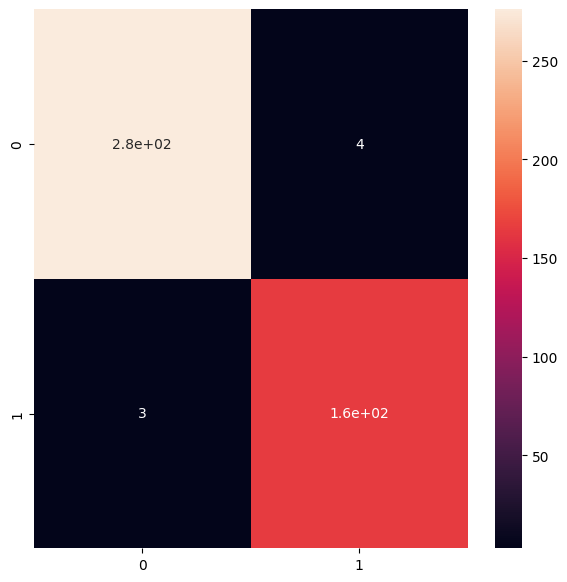

In [ ]:
model_prediction(model_resnet, "Resnet50 Model", test_generator)

In [55]:
#plot_history(history)

In [56]:
train, test = train_test_split(brain_df_train, test_size = 0.23)
TRAIN = train
VAL = train
TEST = test
TRAIN_PATH = TEST_PATH = VAL_PATH = './'
BATCH_SIZE = 16
CLASS_MODE = "categorical"
IMAGE_SHAPE = (256,256)
train_generator, valid_generator, test_generator = train_val_test_data_gen(TRAIN,
                                                                           TRAIN_PATH,
                                                                           VAL,
                                                                           VAL_PATH,
                                                                           TEST,
                                                                           TEST_PATH,
                                                                           CLASS_MODE,
                                                                           BATCH_SIZE,
                                                                           IMAGE_SHAPE)

Found 2118 validated image filenames belonging to 2 classes.
Found 907 validated image filenames belonging to 2 classes.
Found 904 validated image filenames belonging to 2 classes.


In [57]:
train_generator[0][0].shape

(16, 256, 256, 3)

In [58]:
def CNN_MODEL():
    model=Sequential()
    model.add(Conv2D(filters=32,kernel_size=(3,3),activation="relu",kernel_initializer="he_uniform",padding="same",input_shape=(256,256,3)))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(filters=64,kernel_size=(3,3),activation="relu",kernel_initializer="he_uniform",padding="same",input_shape=(256,256,3)))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.2))
    model.add(Conv2D(filters=128,kernel_size=(3,3),activation="relu",kernel_initializer="he_uniform",padding="same",input_shape=(256,256,3)))
    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.2))
    model.add(Flatten())
    model.add(Dense(units=128,activation="relu",kernel_initializer="he_uniform"))
    model.add(Dropout(0.5))
    model.add(Dense(units=2,activation="softmax"))
    model.compile(optimizer="adam",loss="categorical_crossentropy",metrics=["accuracy"])
    return model

In [59]:
checkpointer, callback1, callback2, callback3 = make_callback_earlystop("/content/CNN_MODEL_weights")

NameError: name 'make_callback_earlystop' is not defined

In [ ]:
model_cnn=CNN_MODEL()
history = model_cnn.fit(train_generator,
                              steps_per_epoch=train_generator.n // BATCH_SIZE,
                              validation_data=train_generator,
                              validation_steps=valid_generator.n // BATCH_SIZE,
                              epochs=20,
                              callbacks=[checkpointer, callback1, callback2, callback3])

New learning rate for epoch=0 is 0.0009500000451225787

Epoch 1: LearningRateScheduler setting learning rate to 0.0009500000451225787.
Epoch 1/20
137/137 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step - accuracy: 0.6497 - loss: 3.2697
Epoch 1: val_accuracy improved from -inf to 0.77478, saving model to /kaggle/working/CNN_MODEL_weights.h5
137/137 ━━━━━━━━━━━━━━━━━━━━ 15s 73ms/step - accuracy: 0.6501 - loss: 3.2554 - val_accuracy: 0.7748 - val_loss: 0.4613 - learning_rate: 9.5000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0009500000160187483.
Epoch 2/20
  1/137 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.8125 - loss: 0.3864

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()



Epoch 2: val_accuracy did not improve from 0.77478

Epoch 2: ReduceLROnPlateau reducing learning rate to 4.750000080093742e-05.
137/137 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.8125 - loss: 0.3864 - val_accuracy: 0.7619 - val_loss: 0.4655 - learning_rate: 4.7500e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.7500001528533176e-05.
Epoch 3/20
136/137 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7853 - loss: 0.4402
Epoch 3: val_accuracy improved from 0.77478 to 0.78341, saving model to /kaggle/working/CNN_MODEL_weights.h5
137/137 ━━━━━━━━━━━━━━━━━━━━ 7s 50ms/step - accuracy: 0.7851 - loss: 0.4404 - val_accuracy: 0.7834 - val_loss: 0.4575 - learning_rate: 4.7500e-05
New learning rate for epoch=3 is 4.5125001452106514e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.5125001452106514e-05.
Epoch 4/20
  1/137 ━━━━━━━━━━━━━━━━━━━━ 4s 35ms/step - accuracy: 0.9375 - loss: 0.3446
Epoch 4: val_accuracy improved from 0.78341 to 0.78448, saving model to /kaggl

Lowest Validation Loss: epoch 8
Highest Validation Accuracy: epoch 8


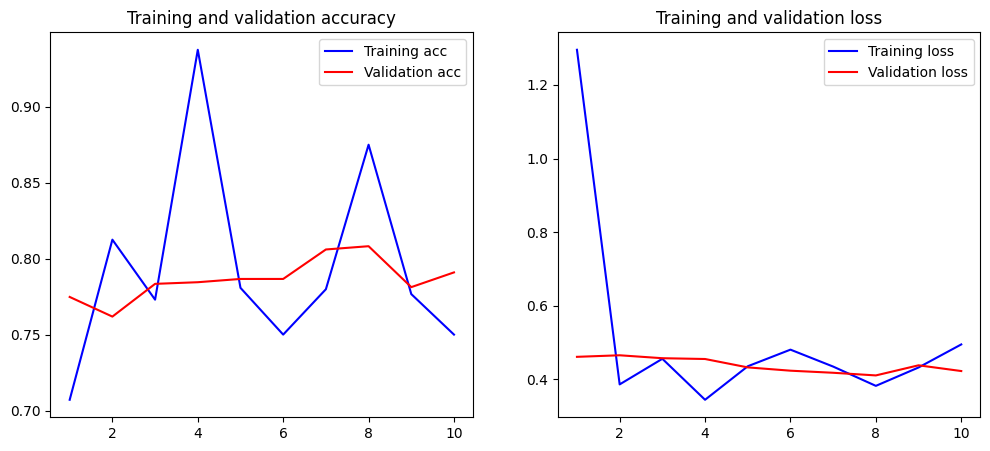

In [ ]:
plot_history(history)

In [ ]:
model_cnn.save_weights('CNN_MODEL.weights.h5')

NameError: name 'model_cnn' is not defined

In [ ]:
model_json = model_cnn.to_json()
with open("CNN_MODEL.json","w") as json_file:
      json_file.write(model_json)

OSError: [Errno 30] Read-only file system: 'CNN_MODEL.json'

In [ ]:
with open('CNN_MODEL.json', 'r') as json_file:
    json_savedModel= json_file.read()
# load the model  |
model = tf.keras.models.model_from_json(json_savedModel)
model.load_weights('CNN_MODEL_weights.hdf5')
model.compile(loss = 'categorical_crossentropy', optimizer='adam', metrics= ["accuracy"])

24/24 ━━━━━━━━━━━━━━━━━━━━ 1s 45ms/step

CNN Model accuracy: 78.125 %
CNN Model balanced accuracy : 77.5096 %
CNN Model recall: 78.125 %
CNN Model f1_weighted: 78.4506 %
CNN Model f1_average: 78.125 %
CNN Model precision: 78.125 %


              precision    recall  f1-score   support

           0       0.86      0.79      0.83       253
           1       0.66      0.76      0.70       131

   micro avg       0.78      0.78      0.78       384
   macro avg       0.76      0.78      0.76       384
weighted avg       0.79      0.78      0.78       384



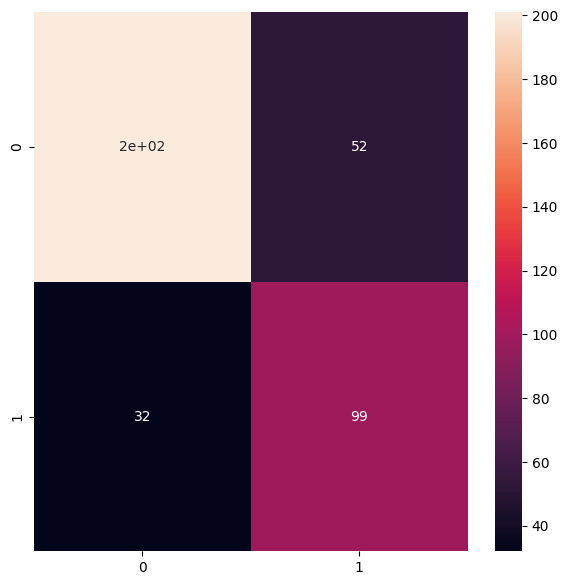

In [ ]:
model_prediction(model_cnn, "CNN Model", test_generator)

###SEGMENTATION

In [60]:
brain_df_mask = brain_df[brain_df['mask'] == 1]
brain_df_mask.shape

(1373, 4)

In [61]:
from sklearn.model_selection import train_test_split
X_train, X_val = train_test_split(brain_df_mask, test_size=0.15)
X_test, X_val = train_test_split(X_val, test_size=0.5)
X_train

,patient_id,image_path,mask_path,mask
3646,TCGA_DU_7010_19860307,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
2079,TCGA_FG_6690_20020226,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
1824,TCGA_DU_A5TY_19970709,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
1216,TCGA_DU_7008_19830723,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
1615,TCGA_DU_A5TP_19970614,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
...,...,...,...,...
2481,TCGA_FG_A60K_20040224,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
1168,TCGA_DU_7013_19860523,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
2507,TCGA_FG_A60K_20040224,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1
1855,TCGA_FG_5962_20000626,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1


In [62]:
#separate list for imageId, classId to pass into the generator
train_ids = list(X_train.image_path)
train_mask = list(X_train.mask_path)
val_ids = list(X_val.image_path)
val_mask= list(X_val.mask_path)
print(train_ids[0])
print(train_mask[0])
print(val_ids[0])
print(val_mask[0])

/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_48.tif
/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_HT_A61A_20000127/TCGA_HT_A61A_20000127_48_mask.tif
/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_HT_7855_19951020/TCGA_HT_7855_19951020_15.tif
/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_HT_7855_19951020/TCGA_HT_7855_19951020_15_mask.tif


In [63]:
class DataGenerator(tf.keras.utils.Sequence):
  def __init__(self, ids , mask, image_dir = '', batch_size = 16, img_h = 256, img_w = 256, shuffle = True):

    self.ids = ids
    self.mask = mask
    self.image_dir = image_dir
    self.batch_size = batch_size
    self.img_h = img_h
    self.img_w = img_w
    self.shuffle = shuffle
    self.on_epoch_end()

  def __len__(self):
    'Get the number of batches per epoch'

    return int(np.floor(len(self.ids)) / self.batch_size)

  def __getitem__(self, index):
    'Generate a batch of data'

    #generate index of batch_size length
    indexes = self.indexes[index* self.batch_size : (index+1) * self.batch_size]

    #get the ImageId corresponding to the indexes created above based on batch size
    list_ids = [self.ids[i] for i in indexes]

    #get the MaskId corresponding to the indexes created above based on batch size
    list_mask = [self.mask[i] for i in indexes]


    #generate data for the X(features) and y(label)
    X, y = self.__data_generation(list_ids, list_mask)

    #returning the data
    return X, y

  def on_epoch_end(self):
    'Used for updating the indices after each epoch, once at the beginning as well as at the end of each epoch'

    #getting the array of indices based on the input dataframe
    self.indexes = np.arange(len(self.ids))

    #if shuffle is true, shuffle the indices
    if self.shuffle:
      np.random.shuffle(self.indexes)

  def __data_generation(self, list_ids, list_mask):
    'generate the data corresponding the indexes in a given batch of images'

    # create empty arrays of shape (batch_size,height,width,depth)
    #Depth is 3 for input and depth is taken as 1 for output becasue mask consist only of 1 channel.
    X = np.empty((self.batch_size, self.img_h, self.img_w, 3))
    y = np.empty((self.batch_size, self.img_h, self.img_w, 1))

    #iterate through the dataframe rows, whose size is equal to the batch_size
    for i in range(len(list_ids)):
      #path of the image
      img_path =  str(list_ids[i])

      #mask path
      mask_path = str(list_mask[i])

      #reading the original image and the corresponding mask image
      img = io.imread(img_path)
      mask = io.imread(mask_path)

      #resizing and coverting them to array of type float64
      img = cv2.resize(img,(self.img_h,self.img_w))
      img = np.array(img, dtype = np.float64)

      mask = cv2.resize(mask,(self.img_h,self.img_w))
      mask = np.array(mask, dtype = np.float64)

      #standardising
      img -= img.mean()
      img /= img.std()
      mask -= mask.mean()
      mask /= mask.std()
      #Adding image to the empty array
      X[i,] = img
      #expanding the dimnesion of the image from (256,256) to (256,256,1)
      y[i,] = np.expand_dims(mask, axis = 2)
    #normalizing y
    y = (y > 0).astype(int)

    return X, y

In [64]:
#Utilities file contains the code for custom loss function and custom data generator
# from utilities import DataGenerator
#create image generators
training_generator = DataGenerator(train_ids,train_mask)
validation_generator = DataGenerator(val_ids,val_mask)

In [ ]:
#training_generator[0]

In [65]:
# @tf.function
def resblock(X, f):

  # make a copy of input
  X_copy = X

  # main path
  # Read more about he_normal: https://medium.com/@prateekvishnu/xavier-and-he-normal-he-et-al-initialization-8e3d7a087528

  X = Conv2D(f, kernel_size = (1,1) ,strides = (1,1),kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  X = Activation('relu')(X)
  X = Conv2D(f, kernel_size = (3,3), strides =(1,1), padding = 'same', kernel_initializer ='he_normal')(X)
  X = BatchNormalization()(X)
  # Short path
  # Read more here: https://towardsdatascience.com/understanding-and-coding-a-resnet-in-keras-446d7ff84d33
  X_copy = Conv2D(f, kernel_size = (1,1), strides =(1,1), kernel_initializer ='he_normal')(X_copy)
  X_copy = BatchNormalization()(X_copy)
  # Adding the output from main path and short path together
  X = Add()([X,X_copy])
  X = Activation('relu')(X)

  return X

In [66]:
# function to upscale and concatenate the values passsed
def upsample_concat(x, skip):
    x = UpSampling2D((2,2))(x)
    merge = Concatenate()([x, skip])
    return merge

In [67]:
input_shape = (256,256,3)
# Input tensor shape
X_input = Input(input_shape)
# Stage 1
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(X_input)
conv1_in = BatchNormalization()(conv1_in)
conv1_in = Conv2D(16,3,activation= 'relu', padding = 'same', kernel_initializer ='he_normal')(conv1_in)
conv1_in = BatchNormalization()(conv1_in)
pool_1 = MaxPool2D(pool_size = (2,2))(conv1_in)
# Stage 2
# pool_1 = tf.reshape
conv2_in = resblock(pool_1, 32)
pool_2 = MaxPool2D(pool_size = (2,2))(conv2_in)
# Stage 3
conv3_in = resblock(pool_2, 64)
pool_3 = MaxPool2D(pool_size = (2,2))(conv3_in)
# Stage 4
conv4_in = resblock(pool_3, 128)
pool_4 = MaxPool2D(pool_size = (2,2))(conv4_in)
# Stage 5 (Bottle Neck)
conv5_in = resblock(pool_4, 256)
# Upscale stage 1
up_1 = upsample_concat(conv5_in, conv4_in)
up_1 = resblock(up_1, 128)
# Upscale stage 2
up_2 = upsample_concat(up_1, conv3_in)
up_2 = resblock(up_2, 64)
# Upscale stage 3
up_3 = upsample_concat(up_2, conv2_in)
up_3 = resblock(up_3, 32)
# Upscale stage 4
up_4 = upsample_concat(up_3, conv1_in)
up_4 = resblock(up_4, 16)
# Final Output
output = Conv2D(1, (1,1), padding = "same", activation = "sigmoid")(up_4)
model_seg = Model(inputs = X_input, outputs = output )

In [68]:
model_seg.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 256, 256,  │        448 │ input_layer[0][0] │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256, 256,  │         64 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 256, 256,  │      2,320 │ batch_normalizat… │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256, 256,  │         64 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 128, 128,  │        544 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 128, 128,  │      9,248 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │        544 │ max_pooling2d[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ batch_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 128, 128,  │          0 │ add[0][0]         │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 64, 64,    │          0 │ activation_1[0][… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 64, 64,    │      2,112 │ max_pooling2d_1[

 Total params: 1,210,513 (4.62 MB)

 Trainable params: 1,206,129 (4.60 MB)

 Non-trainable params: 4,384 (17.12 KB)

In [69]:
from tensorflow.keras import backend as K
def tversky(y_true, y_pred, smooth = 1e-6):
    y_true_pos =  tf.cast(K.flatten(y_true), tf.float32)
    y_pred_pos =  tf.cast(K.flatten(y_pred), tf.float32)
    true_pos = K.sum(y_true_pos * y_pred_pos)
    false_neg = K.sum(y_true_pos * (1-y_pred_pos))
    false_pos = K.sum((1-y_true_pos)*y_pred_pos)
    alpha = 0.7
    return (true_pos + smooth)/(true_pos + alpha*false_neg + (1-alpha)*false_pos + smooth)

def tversky_loss(y_true, y_pred):
    return 1 - tversky(y_true,y_pred)

def focal_tversky(y_true,y_pred):
    pt_1 = tversky(y_true, y_pred)
    gamma = 0.75
    return K.pow((1-pt_1), gamma)

In [70]:
adam = tf.keras.optimizers.Adam(learning_rate = 0.05, epsilon = 0.1)
model_seg.compile(optimizer = adam, loss = focal_tversky, metrics = [tversky])

In [ ]:
# use early stopping to exit training if validation loss is not decreasing even after certain epochs (patience)
earlystopping = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=20)
# save the best model with lower validation loss
checkpointer = ModelCheckpoint(filepath="/content/drive/MyDrive/new/Deployment/saved_models/ResUNet-weights.h5", verbose=1, save_best_only=True)

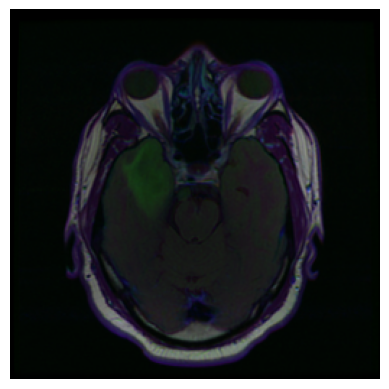

In [71]:
# im_plt = plt.imread(brain_df.mask_path[623])
im_cv = cv.imread("/content/drive/MyDrive/lgg_dataset/kaggle_3m/TCGA_DU_A5TS_19970726/TCGA_DU_A5TS_19970726_11.tif")[:, :, ::-1] #OpenCV users BGR instead of RGB
plt.axis("off")
# plt.imshow(im_plt)
plt.imshow(im_cv) # works
plt.show()

In [ ]:
history = model_seg.fit(training_generator, epochs = 10, validation_data = validation_generator, callbacks = [checkpointer, earlystopping])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - loss: 0.8962 - tversky: 0.1357 

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()



Epoch 1: val_loss improved from inf to 0.84289, saving model to /content/drive/MyDrive/new/Deployment/saved_models/ResUNet-weights.h5


72/72 ━━━━━━━━━━━━━━━━━━━━ 988s 13s/step - loss: 0.8958 - tversky: 0.1363 - val_loss: 0.8429 - val_tversky: 0.2035
Epoch 2/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step - loss: 0.6869 - tversky: 0.3900
Epoch 2: val_loss improved from 0.84289 to 0.61031, saving model to /content/drive/MyDrive/new/Deployment/saved_models/ResUNet-weights.h5


72/72 ━━━━━━━━━━━━━━━━━━━━ 32s 451ms/step - loss: 0.6856 - tversky: 0.3915 - val_loss: 0.6103 - val_tversky: 0.4820
Epoch 3/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.4674 - tversky: 0.6349
Epoch 3: val_loss did not improve from 0.61031
72/72 ━━━━━━━━━━━━━━━━━━━━ 26s 241ms/step - loss: 0.4670 - tversky: 0.6353 - val_loss: 0.6577 - val_tversky: 0.4273
Epoch 4/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step - loss: 0.3966 - tversky: 0.7064
Epoch 4: val_loss improved from 0.61031 to 0.53170, saving model to /content/drive/MyDrive/new/Deployment/saved_models/ResUNet-weights.h5


72/72 ━━━━━━━━━━━━━━━━━━━━ 20s 238ms/step - loss: 0.3963 - tversky: 0.7067 - val_loss: 0.5317 - val_tversky: 0.5659
Epoch 5/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.3292 - tversky: 0.7715
Epoch 5: val_loss improved from 0.53170 to 0.41613, saving model to /content/drive/MyDrive/new/Deployment/saved_models/ResUNet-weights.h5


72/72 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.3293 - tversky: 0.7714 - val_loss: 0.4161 - val_tversky: 0.6885
Epoch 6/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - loss: 0.3201 - tversky: 0.7794
Epoch 6: val_loss improved from 0.41613 to 0.32027, saving model to /content/drive/MyDrive/new/Deployment/saved_models/ResUNet-weights.h5


72/72 ━━━━━━━━━━━━━━━━━━━━ 21s 244ms/step - loss: 0.3199 - tversky: 0.7796 - val_loss: 0.3203 - val_tversky: 0.7794
Epoch 7/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 218ms/step - loss: 0.2842 - tversky: 0.8113
Epoch 7: val_loss did not improve from 0.32027
72/72 ━━━━━━━━━━━━━━━━━━━━ 17s 235ms/step - loss: 0.2841 - tversky: 0.8114 - val_loss: 0.3516 - val_tversky: 0.7510
Epoch 8/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 213ms/step - loss: 0.2661 - tversky: 0.8276
Epoch 8: val_loss did not improve from 0.32027
72/72 ━━━━━━━━━━━━━━━━━━━━ 18s 250ms/step - loss: 0.2660 - tversky: 0.8277 - val_loss: 0.3643 - val_tversky: 0.7381
Epoch 9/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step - loss: 0.2457 - tversky: 0.8445
Epoch 9: val_loss did not improve from 0.32027
72/72 ━━━━━━━━━━━━━━━━━━━━ 17s 230ms/step - loss: 0.2457 - tversky: 0.8446 - val_loss: 0.3397 - val_tversky: 0.7593
Epoch 10/10
72/72 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step - loss: 0.2282 - tversky: 0.8595
Epoch 10: val_loss improved from 0.32027 to 0.24137, s

72/72 ━━━━━━━━━━━━━━━━━━━━ 17s 241ms/step - loss: 0.2281 - tversky: 0.8595 - val_loss: 0.2414 - val_tversky: 0.8484


In [ ]:
# prompt: save the above model

model_seg.save('/content/drive/MyDrive/ResUNet_model.h5')

In [73]:
def plot_history(history):
    # Change 'accuracy' to 'tversky' and 'val_accuracy' to 'val_tversky'
    acc = history.history['tversky']
    val_acc = history.history['val_tversky']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    x = range(1, len(acc) + 1)

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    # Update labels to reflect the 'tversky' metric
    plt.plot(x, acc, 'b', label='Training Tversky')
    plt.plot(x, val_acc, 'r', label='Validation Tversky')
    # Update title
    plt.title('Training and validation Tversky score')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(x, loss, 'b', label='Training loss')
    plt.plot(x, val_loss, 'r', label='Validation loss')
    plt.title('Training and validation loss')
    plt.legend()
    # Update print statements to reflect the 'tversky' metric
    print("Lowest Validation Loss: epoch {}".format(np.argmin(val_loss)+1))
    print("Highest Validation Tversky: epoch {}".format(np.argmax(val_acc)+1))

Lowest Validation Loss: epoch 10
Highest Validation Tversky: epoch 10


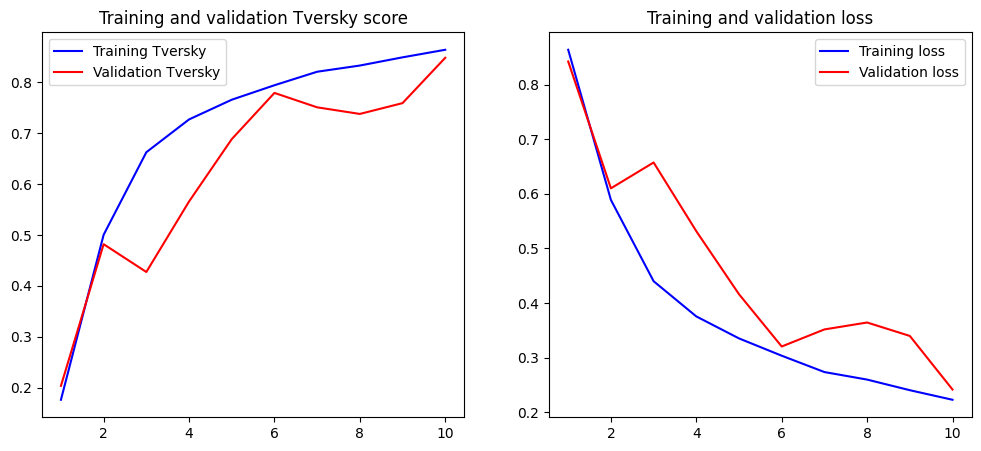

In [ ]:
plot_history(history)

In [75]:
model_seg = load_model(
    "/content/drive/MyDrive/ResUNet_model.h5",
    custom_objects={'focal_tversky': focal_tversky, 'tversky': tversky}
)


In [76]:
def prediction(test, model, model_seg):
  '''
  Predcition function which takes dataframe containing ImageID as Input and perform 2 type of prediction on the image
  Initially, image is passed through the classification network which predicts whether the image has defect or not, if the model
  is 99% sure that the image has no defect, then the image is labeled as no-defect, if the model is not sure, it passes the image to the
  segmentation network, it again checks if the image has defect or not, if it has defect, then the type and location of defect is found
  '''

  #directory
  directory = ""

  #Creating empty list to store the results
  mask = []
  image_id = []
  has_mask = []

  #iterating through each image in the test data
  for i in test.image_path:

    path = directory + str(i)

    #reading the image
    img = io.imread(path)

    #Normalizing the image
    img = img * 1./255.

    #Reshaping the image
    img = cv2.resize(img,(256,256))

    #Converting the image into array
    img = np.array(img, dtype = np.float64)

    #reshaping the image from 256,256,3 to 1,256,256,3
    img = np.reshape(img, (1,256,256,3))

    #making prediction on the image
    is_defect = model.predict(img)

    #if tumour is not present we append the details of the image to the list
    if np.argmax(is_defect) == 0:
      image_id.append(i)
      has_mask.append(0)
      mask.append('No mask')
      continue

    #Read the image
    img = io.imread(path)

    #Creating a empty array of shape 1,256,256,1
    X = np.empty((1, 256, 256, 3))

    #resizing the image and coverting them to array of type float64
    img = cv2.resize(img,(256,256))
    img = np.array(img, dtype = np.float64)

    #standardising the image
    img -= img.mean()
    img /= img.std()

    #converting the shape of image from 256,256,3 to 1,256,256,3
    X[0,] = img

    #make prediction
    predict = model_seg.predict(X)

    #if the sum of predicted values is equal to 0 then there is no tumour
    if predict.round().astype(int).sum() == 0:
        image_id.append(i)
        has_mask.append(0)
        mask.append('No mask')
    else:
    #if the sum of pixel values are more than 0, then there is tumour
        image_id.append(i)
        has_mask.append(1)
        mask.append(predict)


  return image_id, mask, has_mask

In [77]:
# Utilities file contains the code for custom loss function and custom data generator
# making prediction
image_id, mask, has_mask = prediction(test, model_resnet, model_seg)

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 236ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 227ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 228ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 249ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 250ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 225ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 246ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 234ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 230ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 224ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139

In [78]:
# creating a dataframe for the result
df_pred = pd.DataFrame({'image_path': image_id,'predicted_mask': mask,'has_mask': has_mask})
df_pred

,image_path,predicted_mask,has_mask
0,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,"[[[[3.756842e-05], [4.9762108e-05], [1.8543253...",1
1,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,No mask,0
2,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,"[[[[5.0024457e-05], [8.1747094e-05], [2.699287...",1
3,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,No mask,0
4,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,No mask,0
...,...,...,...
899,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,No mask,0
900,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,No mask,0
901,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,"[[[[5.1343995e-05], [8.032426e-05], [2.7955495...",1
902,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,"[[[[5.1117793e-05], [8.3852545e-05], [2.702625...",1


In [79]:
# Merge the dataframe containing predicted results with the original test data.
df_pred = test.merge(df_pred, on = 'image_path')
df_pred.head()

,image_path,mask_path,mask,predicted_mask,has_mask
0,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1,"[[[[3.756842e-05], [4.9762108e-05], [1.8543253...",1
1,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0,No mask,0
2,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,1,"[[[[5.0024457e-05], [8.1747094e-05], [2.699287...",1
3,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0,No mask,0
4,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,/content/drive/MyDrive/lgg_dataset/kaggle_3m/T...,0,No mask,0


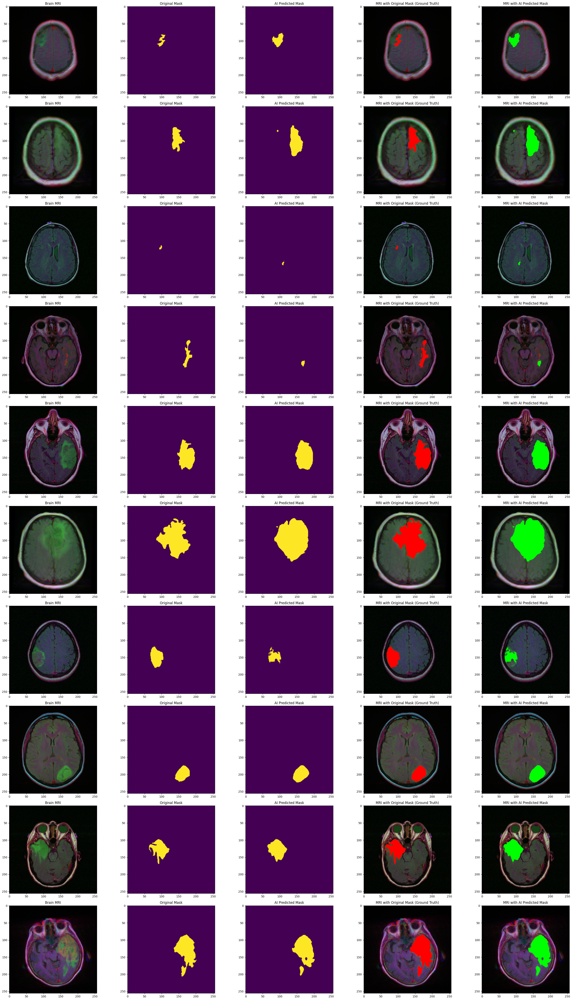

In [80]:
count = 0
fig, axs = plt.subplots(10, 5, figsize=(30, 50))
for i in range(len(df_pred)):
  if df_pred['has_mask'][i] == 1 and count < 10:
    # read the images and convert them to RGB format
    img = io.imread(df_pred.image_path[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[count][0].title.set_text("Brain MRI")
    axs[count][0].imshow(img)

    # Obtain the mask for the image
    mask = io.imread(df_pred.mask_path[i])
    axs[count][1].title.set_text("Original Mask")
    axs[count][1].imshow(mask)

    # Obtain the predicted mask for the image
    predicted_mask = np.asarray(df_pred.predicted_mask[i])[0].squeeze().round()
    axs[count][2].title.set_text("AI Predicted Mask")
    axs[count][2].imshow(predicted_mask)

    # Apply the mask to the image 'mask==255'
    img[mask == 255] = (255, 0, 0)
    axs[count][3].title.set_text("MRI with Original Mask (Ground Truth)")
    axs[count][3].imshow(img)

    img_ = io.imread(df_pred.image_path[i])
    img_ = cv2.cvtColor(img_, cv2.COLOR_BGR2RGB)
    img_[predicted_mask == 1] = (0, 255, 0)
    axs[count][4].title.set_text("MRI with AI Predicted Mask")
    axs[count][4].imshow(img_)
    count += 1

fig.tight_layout()